In [11]:
! pip install utils

In [43]:
! pip install mlxtend
! pip install -U statsmodels

     |████████████████████████████████| 1.3 MB 6.7 MB/s eta 0:00:01


In [4]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
#from utils import discrete_plot
from sklearn import datasets
import statsmodels.api as sm
import statsmodels.formula.api as smf
from itertools import cycle
from tqdm.auto import tqdm
from sklearn.linear_model import LinearRegression

warnings.simplefilter('ignore')
pd.options.display.max_rows = 100
init_notebook_mode(connected=True)
%matplotlib inline

## References
#### https://github.com/jgcorliss/lending-club/blob/master/predicting_chargeoff.ipynb

In [50]:
data = pd.read_csv('/Volumes/GoogleDrive/My Drive/Jobs & Internship/Interview/Stout/loans_full_schema.csv')

In [51]:
loans = pd.DataFrame(data)

In [52]:
loans.columns

Index(['emp_title', 'emp_length', 'state', 'homeownership', 'annual_income',
       'verified_income', 'debt_to_income', 'annual_income_joint',
       'verification_income_joint', 'debt_to_income_joint', 'delinq_2y',
       'months_since_last_delinq', 'earliest_credit_line',
       'inquiries_last_12m', 'total_credit_lines', 'open_credit_lines',
       'total_credit_limit', 'total_credit_utilized',
       'num_collections_last_12m', 'num_historical_failed_to_pay',
       'months_since_90d_late', 'current_accounts_delinq',
       'total_collection_amount_ever', 'current_installment_accounts',
       'accounts_opened_24m', 'months_since_last_credit_inquiry',
       'num_satisfactory_accounts', 'num_accounts_120d_past_due',
       'num_accounts_30d_past_due', 'num_active_debit_accounts',
       'total_debit_limit', 'num_total_cc_accounts', 'num_open_cc_accounts',
       'num_cc_carrying_balance', 'num_mort_accounts',
       'account_never_delinq_percent', 'tax_liens', 'public_record_bankr

In [8]:
loans.describe().T

,count,mean,std,min,25%,50%,75%,max
emp_length,9183.0,5.930306,3.703734,0.00,2.0000,6.000,10.0000,1.000000e+01
annual_income,10000.0,79222.148412,64734.290492,0.00,45000.0000,65000.000,95000.0000,2.300000e+06
debt_to_income,9976.0,19.308192,15.004851,0.00,11.0575,17.570,25.0025,4.690900e+02
annual_income_joint,1495.0,127914.571244,70168.375404,19200.00,86833.5000,113000.000,151545.5000,1.100000e+06
debt_to_income_joint,1495.0,19.979304,8.054781,0.32,14.1600,19.720,25.5000,3.998000e+01
delinq_2y,10000.0,0.216000,0.683660,0.00,0.0000,0.000,0.0000,1.300000e+01
months_since_last_delinq,4342.0,36.760709,21.634939,1.00,19.0000,34.000,53.0000,1.180000e+02
earliest_credit_line,10000.0,2001.290000,7.795510,1963.00,1997.0000,2003.000,2006.0000,2.015000e+03
inquiries_last_12m,10000.0,1.958200,2.380130,0.00,0.0000,1.000,3.0000,2.900000e+01
total_credit_lines,10000.0,22.679600,11.885439,2.00,14.0000,21.000,29.0000,8.700000e+01


# Describe the dataset

In [9]:
missing = loans.isnull().mean().sort_values(ascending = False)

In [10]:
missing.head()

verification_income_joint    0.8545
debt_to_income_joint         0.8505
annual_income_joint          0.8505
months_since_90d_late        0.7715
months_since_last_delinq     0.5658
dtype: float64

Text(0, 0.5, 'Feature count')

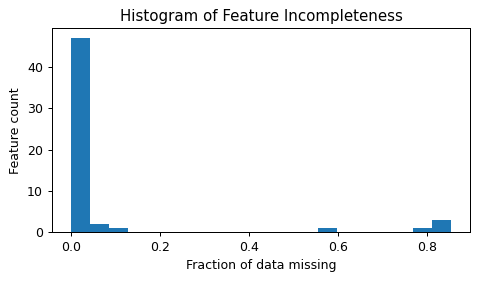

In [11]:
plt.figure(figsize=(6,3), dpi=90)
missing.plot.hist(bins=20)
plt.title('Histogram of Feature Incompleteness')
plt.xlabel('Fraction of data missing')
plt.ylabel('Feature count')

From above histogram, there is not large gap in missing features between less than 20% and more than 40%. Since, it is generally difficult to impute data with more than 30% missing values, we drop such columns.

In [12]:
#drop feature
drop= sorted(list(missing[missing>0.3].index))

In [13]:
print(drop)

['annual_income_joint', 'debt_to_income_joint', 'months_since_90d_late', 'months_since_last_delinq', 'verification_income_joint']


In [14]:
len(drop)

5

In [15]:
loans.drop(labels=drop,axis=1,inplace =True)

# Visualization 

In [16]:
def plot_var(col_name, full_name, continuous):
    """
    Visualize a variable with and without faceting on the loan status.
    - col_name is the variable name in the dataframe
    - full_name is the full variable name
    - continuous is True if the variable is continuous, False otherwise
    """
    f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,3), dpi=90)
    
    # Plot without loan status
    if continuous:
        sns.distplot(loans.loc[loans[col_name].notnull(), col_name], kde=False, ax=ax1)
    else:
        sns.countplot(loans[col_name], order=sorted(loans[col_name].unique()), color='#5975A4', saturation=1, ax=ax1)
    ax1.set_xlabel(full_name)
    ax1.set_ylabel('Count')
    ax1.set_title(full_name)

    # Plot with loan status
    if continuous:
        sns.boxplot(x=col_name, y='loan_status', data=loans, ax=ax2)
        ax2.set_ylabel('')
        ax2.set_title(full_name + ' by Loan Status')
    else:
        charge_off_rates = loans.groupby(col_name)['loan_status'].value_counts(normalize=True).loc[:,'Charged Off']
        sns.barplot(x=charge_off_rates.index, y=charge_off_rates.values, color='#5975A4', saturation=1, ax=ax2)
        ax2.set_ylabel('Fraction of Loans Charged-off')
        ax2.set_title('Charge-off Rate by ' + full_name)
    ax2.set_xlabel(full_name)
    
    plt.tight_layout()

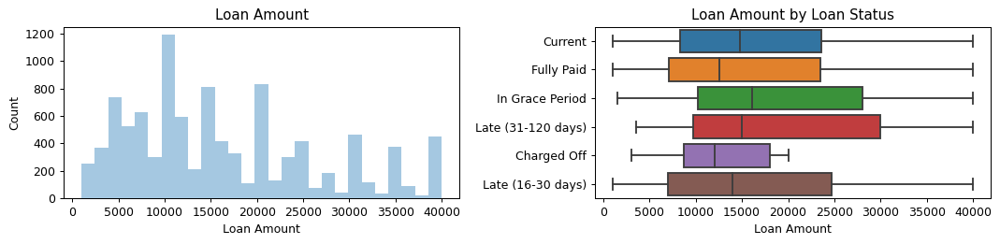

In [37]:
plot_var('loan_amount', 'Loan Amount', continuous=True)

In [38]:
loans.groupby('loan_status')['loan_amount'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,7.0,12642.857143,6407.770580,3000.0,8750.0,12000.0,18000.0,20000.0
Current,9375.0,16366.456000,10281.475105,1000.0,8300.0,14800.0,23587.5,40000.0
Fully Paid,447.0,15590.659955,10505.902183,1000.0,7100.0,12600.0,23475.0,40000.0
In Grace Period,67.0,18614.552239,9871.892635,1550.0,10250.0,16100.0,28000.0,40000.0
Late (16-30 days),38.0,16725.657895,11891.975046,1000.0,7000.0,14000.0,24750.0,40000.0
Late (31-120 days),66.0,18839.772727,11116.572847,3500.0,9700.0,15000.0,30000.0,40000.0


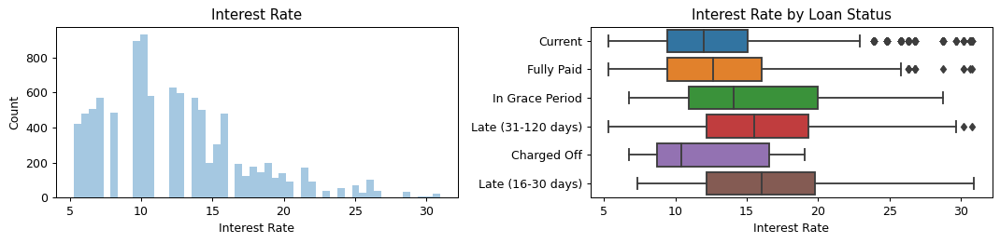

In [40]:
plot_var('interest_rate', 'Interest Rate', continuous=True)

In [42]:
loans.groupby('loan_status')['interest_rate'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,7.0,12.382857,4.894101,6.72,8.700,10.420,16.5550,19.03
Current,9375.0,12.310866,4.924357,5.31,9.430,11.980,15.0500,30.79
Fully Paid,447.0,13.411924,5.499284,5.31,9.440,12.620,16.0200,30.79
In Grace Period,67.0,15.644925,5.987654,6.71,10.910,14.080,20.0000,28.72
Late (16-30 days),38.0,16.847368,6.074489,7.35,12.145,16.015,19.7575,30.94
Late (31-120 days),66.0,16.525000,5.954579,5.31,12.145,15.530,19.3225,30.75


# Feature Set and Model

In [21]:
drop_non=['emp_title','state','homeownership','verified_income','sub_grade','initial_listing_status','disbursement_method','issue_month','loan_purpose','application_type','loan_status','grade']

In [43]:
loans_1 = loans.dropna

In [119]:
loans_1

,emp_length,annual_income,debt_to_income,annual_income_joint,debt_to_income_joint,delinq_2y,months_since_last_delinq,earliest_credit_line,inquiries_last_12m,total_credit_lines,...,public_record_bankrupt,loan_amount,term,interest_rate,installment,balance,paid_total,paid_principal,paid_interest,paid_late_fees
0,3.0,90000.0,18.01,NaN,NaN,0,38.0,2001,6,28,...,0,28000,60,14.07,652.53,27015.86,1999.33,984.14,1015.19,0.0
1,10.0,40000.0,5.04,NaN,NaN,0,NaN,1996,1,30,...,1,5000,36,12.61,167.54,4651.37,499.12,348.63,150.49,0.0
2,3.0,40000.0,21.15,NaN,NaN,0,28.0,2006,4,31,...,0,2000,36,17.09,71.40,1824.63,281.80,175.37,106.43,0.0
3,1.0,30000.0,10.16,NaN,NaN,0,NaN,2007,0,4,...,0,21600,36,6.72,664.19,18853.26,3312.89,2746.74,566.15,0.0
4,10.0,35000.0,57.96,57000.0,37.66,0,NaN,2008,7,22,...,0,23000,36,14.07,786.87,21430.15,2324.65,1569.85,754.80,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,10.0,108000.0,22.28,NaN,NaN,0,NaN,2008,5,44,...,1,24000,36,7.35,744.90,21586.34,2969.80,2413.66,556.14,0.0
9996,8.0,121000.0,32.38,NaN,NaN,4,9.0,1994,1,28,...,0,10000,36,19.03,366.72,9147.44,1456.31,852.56,603.75,0.0
9997,10.0,67000.0,45.26,107000.0,29.57,2,6.0,2004,0,18,...,0,30000,36,23.88,1175.10,27617.65,4620.80,2382.35,2238.45,0.0
9998,1.0,80000.0,11.99,NaN,NaN,0,NaN,1999,1,38,...,0,24000,36,5.32,722.76,21518.12,2873.31,2481.88,391.43,0.0


In [23]:
# y=loans_1['interest_rate']
# X= loans_1.drop (['interest_rate'],axis=1)

In [24]:
X.head().T

,0,1,2,3,4
emp_length,3.00,10.00,3.00,1.00,10.00
annual_income,90000.00,40000.00,40000.00,30000.00,35000.00
debt_to_income,18.01,5.04,21.15,10.16,57.96
delinq_2y,0.00,0.00,0.00,0.00,0.00
earliest_credit_line,2001.00,1996.00,2006.00,2007.00,2008.00
inquiries_last_12m,6.00,1.00,4.00,0.00,7.00
total_credit_lines,28.00,30.00,31.00,4.00,22.00
open_credit_lines,10.00,14.00,10.00,4.00,16.00
total_credit_limit,70795.00,28800.00,24193.00,25400.00,69839.00
total_credit_utilized,38767.00,4321.00,16000.00,4997.00,52722.00


In [44]:
X = sm.add_constant(X)
# full_model = sm.OLS(y.astype(float), X.astype(float)).fit()
# full_model.summary()
y = loans_1.interest_rate

AttributeError: 'function' object has no attribute 'interest_rate'

In [46]:
#model = sm.OLS(y,X).fit()

In [130]:
#model_3.fit(X, y)

In [132]:
loans['interest_rate'].isnull().any()

False

In [133]:
loans['interest_rate'].describe()

count    10000.000000
mean        12.427524
std          5.001105
min          5.310000
25%          9.430000
50%         11.980000
75%         15.050000
max         30.940000
Name: interest_rate, dtype: float64

Text(0.5, 1.0, 'Interest Rate per Year')

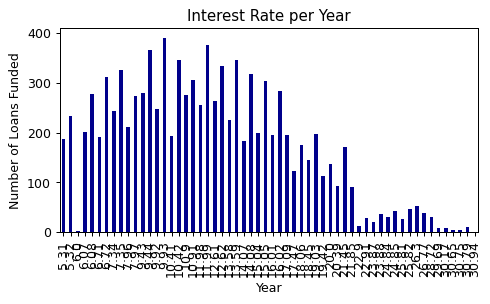

In [136]:
plt.figure(figsize=(6,3), dpi=90)
loans['interest_rate'].value_counts().sort_index().plot.bar(color='darkblue')
plt.xlabel('Year')
plt.ylabel('Number of Loans Funded')
plt.title('Interest Rate per Year')

In [137]:
loans_train = loans.loc[loans['interest_rate'] <  loans['interest_rate'].quantile(0.9)]
loans_test =  loans.loc[loans['interest_rate'] >= loans['interest_rate'].quantile(0.9)]

In [138]:
print('Number of loans in the partition:   ', loans_train.shape[0] + loans_test.shape[0])
print('Number of loans in the full dataset:', loans.shape[0])

Number of loans in the partition:    10000
Number of loans in the full dataset: 10000


In [139]:
loans_test.shape[0] / loans.shape[0]

0.1011

In [141]:
loans_train['interest_rate'].describe()

count    8989.000000
mean       11.267617
std         3.677301
min         5.310000
25%         7.970000
50%        10.900000
75%        14.070000
max        19.030000
Name: interest_rate, dtype: float64

In [142]:
loans_test['interest_rate'].describe()

count    1011.000000
mean       22.740485
std         2.972500
min        19.420000
25%        20.390000
50%        21.450000
75%        24.850000
max        30.940000
Name: interest_rate, dtype: float64

In [1]:
from sklearn.linear_model import LinearRegression

In [2]:
model_3 = LinearRegression()

In [28]:
loans.groupby('term')[["total_credit_limit","total_credit_utilized"]].mean()

,total_credit_limit,total_credit_utilized
term,,
36,170093.129125,48022.138881
60,214690.823102,58011.987789


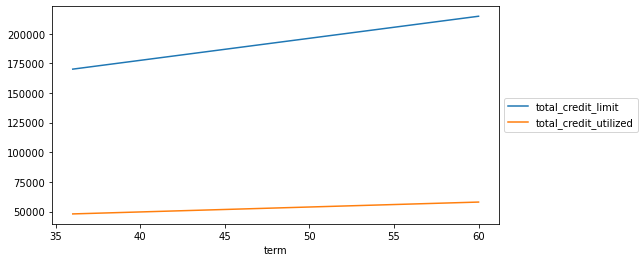

In [30]:
# line chart for to know about credit trend
loans.groupby('term')[["total_credit_limit","total_credit_utilized"]].mean()\
.plot(kind='line', figsize=(8,4))\
.legend(loc='center left', bbox_to_anchor=(1, 0.5));

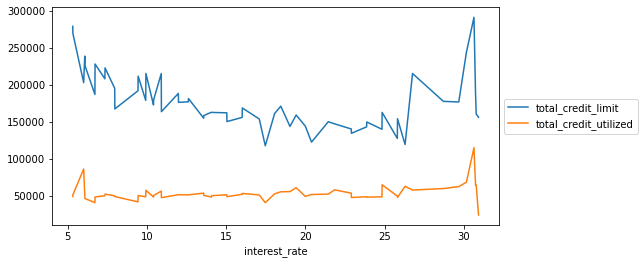

In [32]:
#line chart for to know how credit is varying based on interest rate
loans.groupby('interest_rate')[["total_credit_limit","total_credit_utilized"]].mean()\
.plot(kind='line', figsize=(8,4))\
.legend(loc='center left', bbox_to_anchor=(1, 0.5));

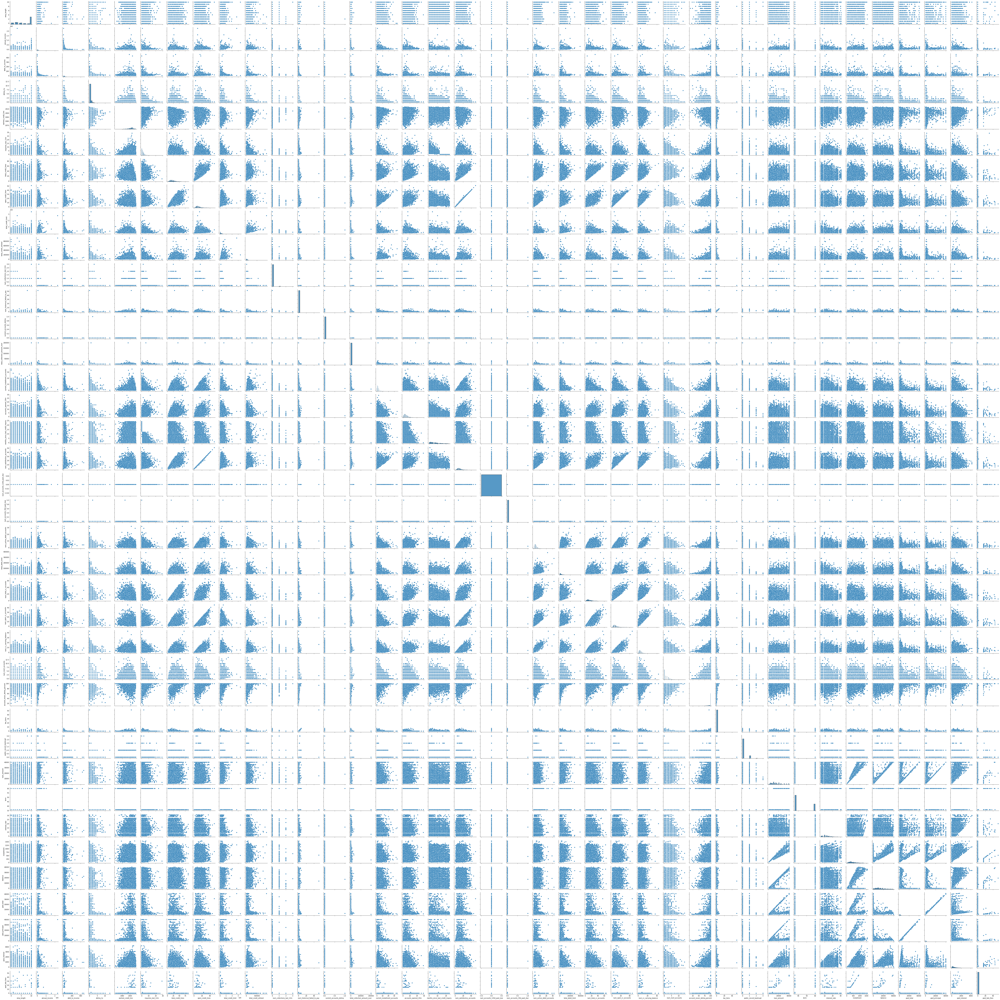

In [33]:
# Pairplot

sns.pairplot(data=loans);

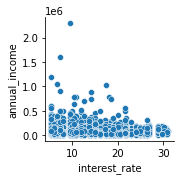

In [37]:
# How loan interest rate vary with accorinding to annual income
sns.pairplot(data=loans, x_vars=['interest_rate'],\
             y_vars=['annual_income']);